Print current working directory.

In [ ]:
!pwd

/content


Mount Google Drive to Google Colab.

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


Change directory to following location.

In [ ]:
%cd /content/gdrive/MyDrive/Colab Notebooks/Rapsodo

/content/gdrive/MyDrive/Colab Notebooks/Rapsodo


Move dataset zip to `/dataset` directory. This command line only needs to be executed once.

In [ ]:
#!mkdir -p dataset/images dataset/annotations output
!mv assignment_sample_data.zip dataset/
!ls

Unzip the dataset zip and its content so that they are now in /dataset folder. This command line only needs to be executed once.


In [ ]:
!unzip dataset/assignment_sample_data.zip -d dataset/

Import necessary packages and libraries.

In [ ]:
import os
import shutil
import mimetypes
import natsort
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm.notebook import tqdm
from google.colab import files
from google.colab.patches import cv2_imshow
from tensorflow.keras.applications import VGG16, InceptionV3, ResNet50, DenseNet121, MobileNet, MobileNetV2
from tensorflow.keras.utils import Sequence
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.models import load_model
from tensorflow.keras.optimizers import Adam, Adadelta, Adagrad, SGD, RMSprop
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

Define configuration variables and parameters.

In [ ]:
BASE_PATH = '/content/gdrive/My Drive/Colab Notebooks/Rapsodo'
DATASET_PATH = os.path.sep.join([BASE_PATH, 'dataset'])
METADATA_PATH = os.path.sep.join([BASE_PATH, 'dataset/baseball.csv'])  # This .csv file contains image paths and their bounding box annotations.
# Define the path to the base output directory
BASE_OUTPUT = os.path.sep.join([BASE_PATH, 'output'])
# Define the path to the output serialized model, model training plot, and testing image filenames
MODEL_PATH = os.path.sep.join([BASE_OUTPUT, "detector.h5"])
PLOT_PATH = os.path.sep.join([BASE_OUTPUT, "plot.png"])
TEST_IMAGES = os.path.sep.join([BASE_OUTPUT, "test_images.txt"])  # This .txt file contains image paths to be tested.
# Initialize our initial learning rate, number of epochs to train for, and the batch size
INIT_LR = 1e-3
NUM_EPOCHS = 25
BATCH_SIZE = 32
DECAY_RATE = 5e-6
MOMENTUM = 0.90

Load dataset into a list called `meta_data`.

In [ ]:
meta_data = []  # List to store meta data informations.

# Iterate through dataset folder
for folder in os.listdir(os.path.sep.join([DATASET_PATH, 'assignment_sample_data'])):  
  # If there is a .txt file for each corresponding .bmp image file
  if len(os.listdir(os.path.sep.join([DATASET_PATH, 'assignment_sample_data', folder]))) % 2 == 0:
    # Iterate through subfolder
    for file in os.listdir(os.path.sep.join([DATASET_PATH, 'assignment_sample_data', folder])):
      # If the file is an image file (.bmp)
      if file.endswith(".bmp"):
        file = file.split('.')[0]
        annotation_data = []  # Create a list to store annotation data
        # Add its path to `image_path` variable
        image_path = os.path.sep.join([DATASET_PATH, 'assignment_sample_data', folder, file + '.bmp'])
        #print(os.path.sep.join([DATASET_PATH, 'assignment_sample_data', folder, file + '.bmp']))
        #print(os.path.sep.join([DATASET_PATH, 'assignment_sample_data', folder, file + '.txt']))

        annotation_data.append(image_path)  # First add corresponding image file's path to the list
        with open(os.path.sep.join([DATASET_PATH, 'assignment_sample_data', folder, file + '.txt']), 'rt') as f:
          first_line = f.readline()
          splited = first_line.split();
          try:
              annotation_data.append(float(splited[1]))
              annotation_data.append(float(splited[2]))
              annotation_data.append(float(splited[3]))
              annotation_data.append(float(splited[4]))
              meta_data.append(annotation_data)
          except:
              print("file is not in YOLO format!")

Create a Pandas dataframe from the list we have created previously.

In [ ]:
df = pd.DataFrame(meta_data, columns=['image_path', 'startX', 'startY', 'w', 'h'])
df.to_csv(METADATA_PATH, index=False)
df.head()

,image_path,startX,startY,w,h
0,/content/gdrive/My Drive/Colab Notebooks/Rapso...,0.631836,0.225000,0.062500,0.050000
1,/content/gdrive/My Drive/Colab Notebooks/Rapso...,0.621094,0.445312,0.041016,0.032813
2,/content/gdrive/My Drive/Colab Notebooks/Rapso...,0.634766,0.185938,0.066406,0.053125
3,/content/gdrive/My Drive/Colab Notebooks/Rapso...,0.621094,0.739062,0.019531,0.015625
4,/content/gdrive/My Drive/Colab Notebooks/Rapso...,0.617188,0.656250,0.023438,0.018750


Visualize some of the samples from the dataset inorder to be sure whether we load data correctly or not.

[INFO] loading dataset...


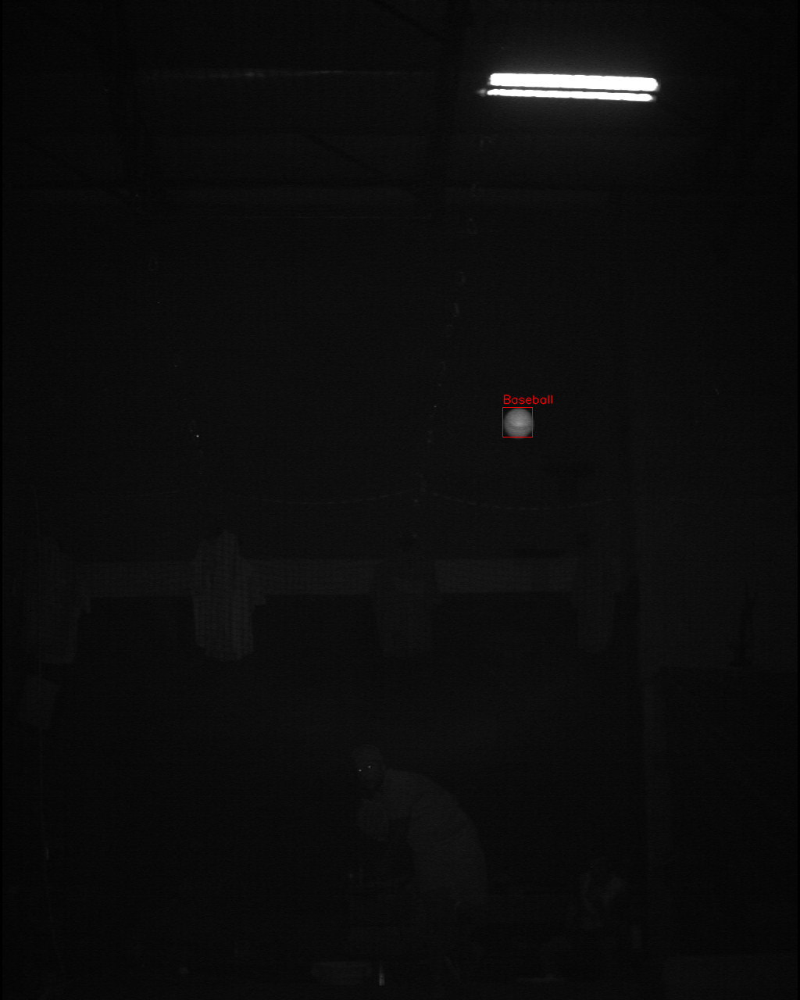

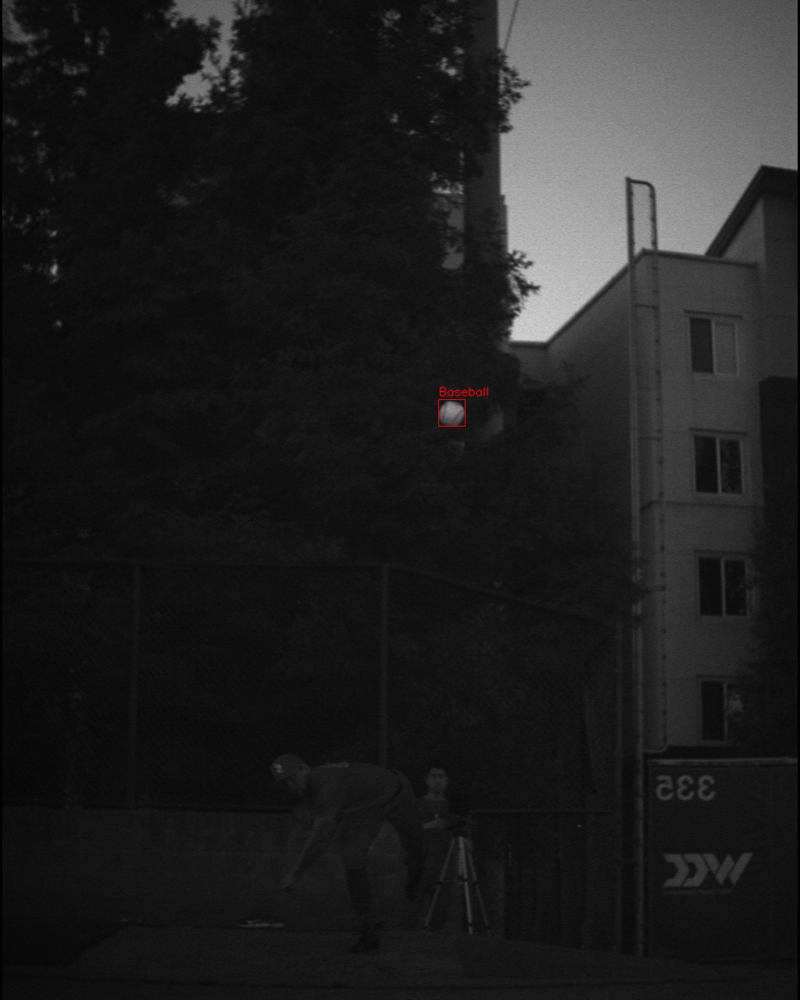

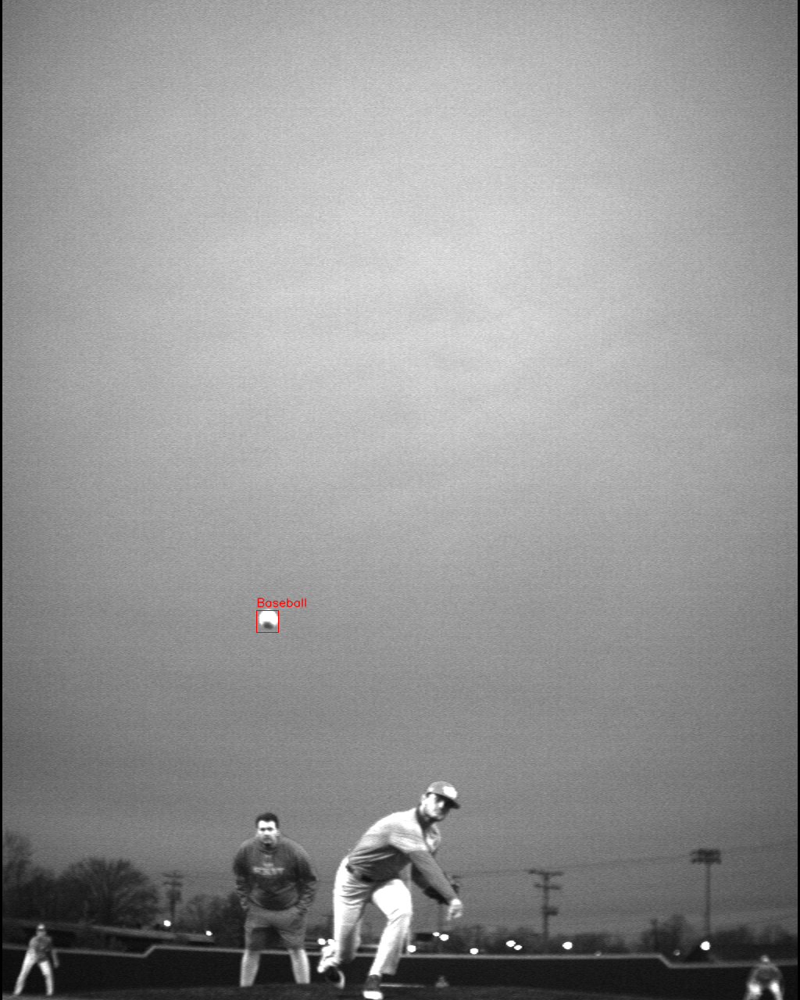

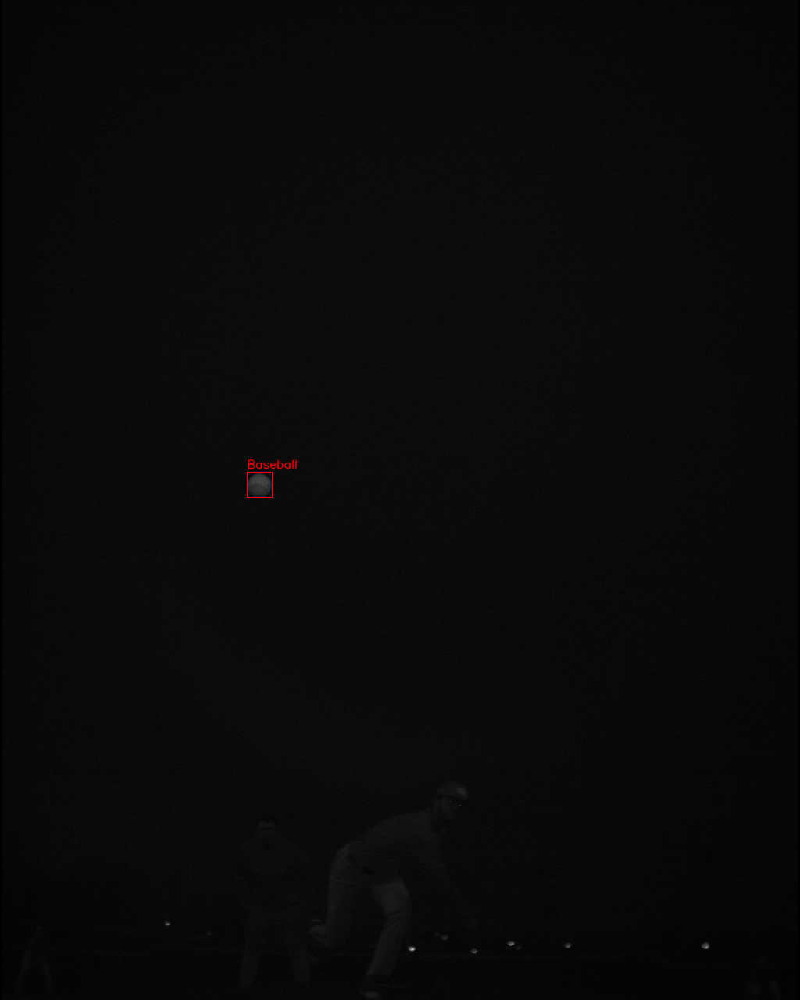

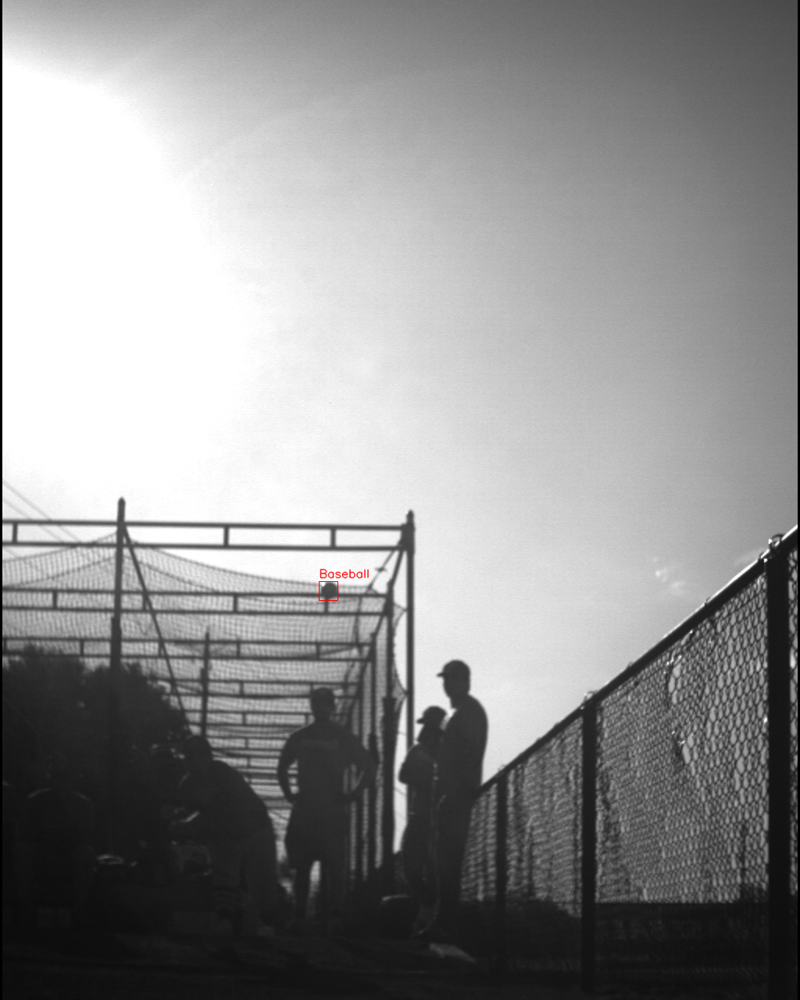

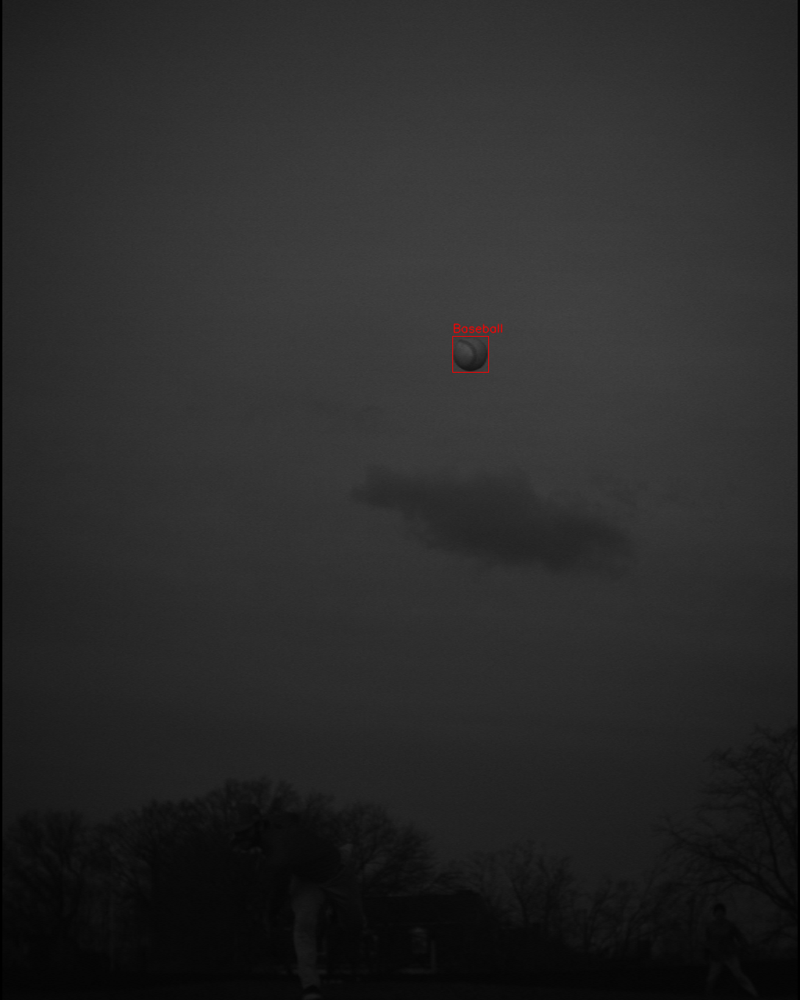

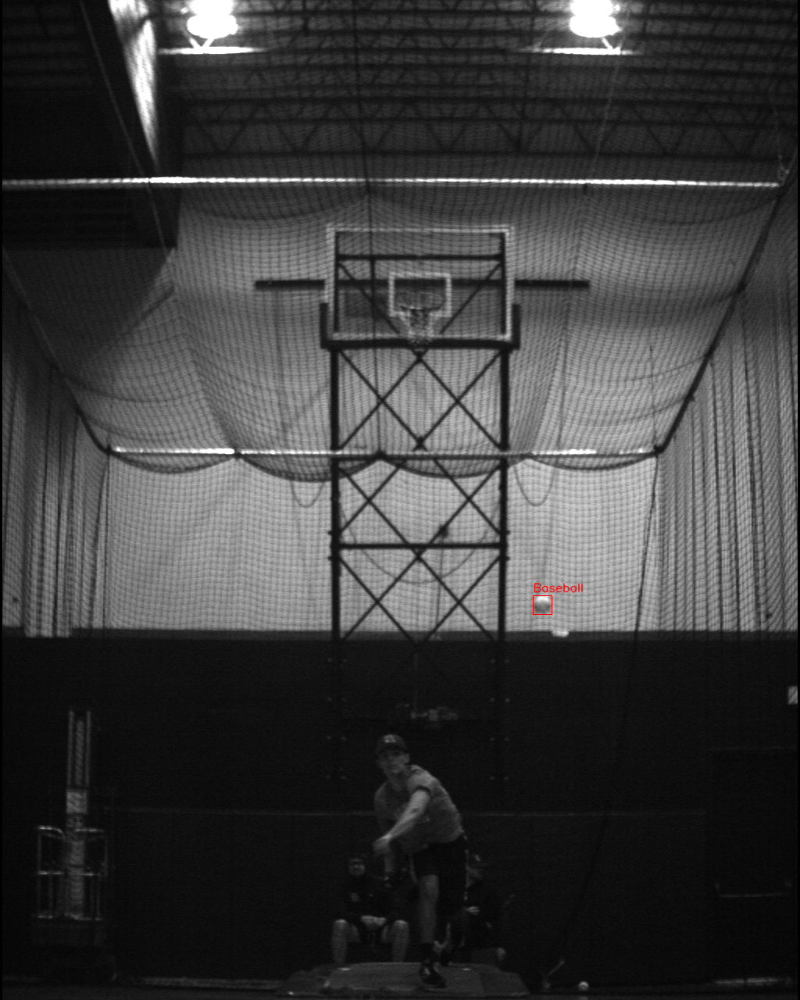

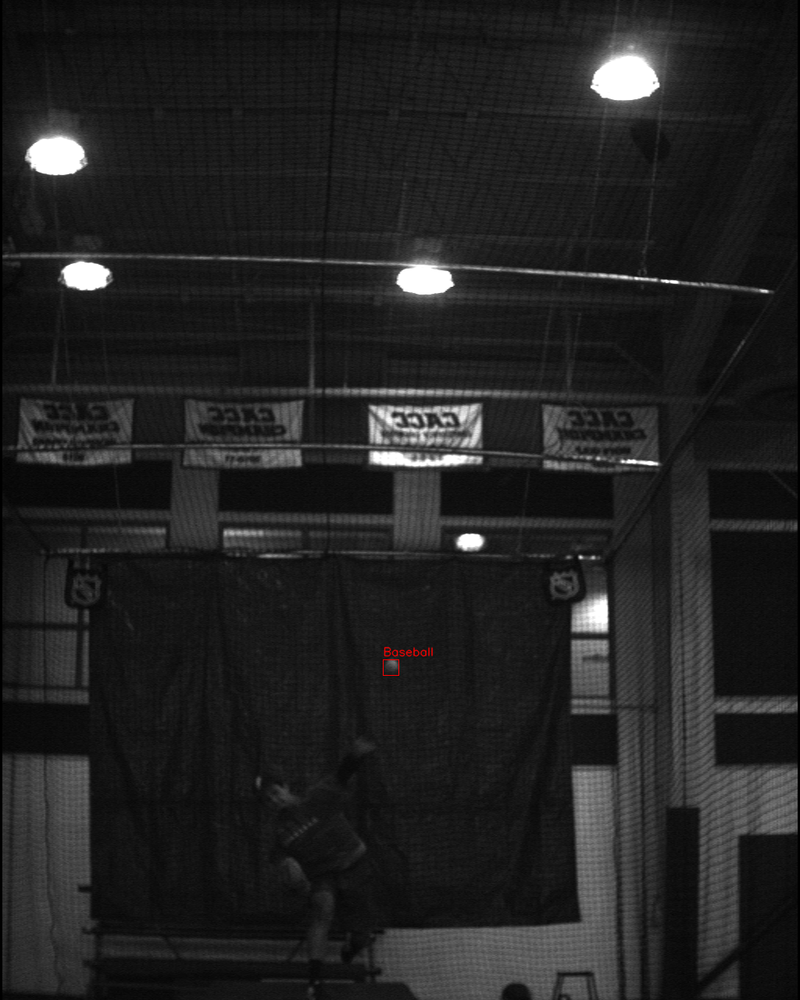

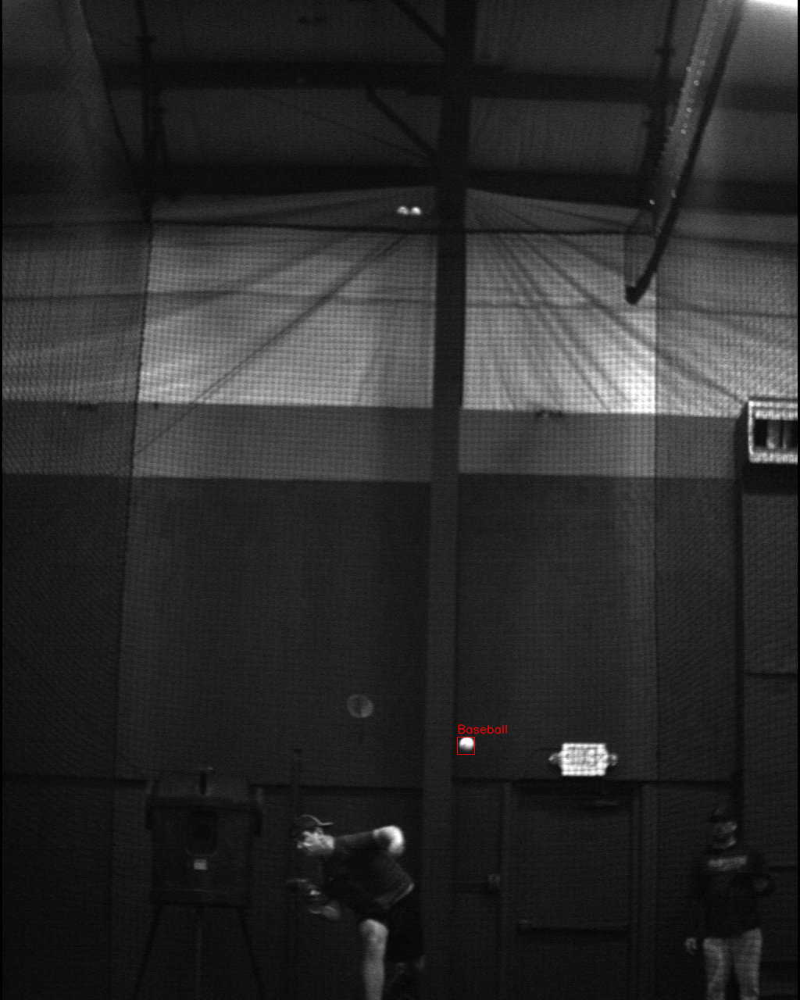

In [ ]:
# Load the contents of the CSV metadata file
print("[INFO] loading dataset...")
rows = open(METADATA_PATH).read().strip().split('\n')
rows = shuffle(rows)

for row in rows[1:10]:
  row = row.split(',')
  (image_path, startX, startY, w, h) = row

  # load the input image (in OpenCV format), resize it such that it
  # fits on our screen, and grab its dimensions
  image = cv2.imread(image_path)
  (image_h, image_w) = image.shape[:2]
  # scale the predicted bounding box coordinates based on the image
  # dimensions
  startX = int(float(startX) * image_w)
  startY = int(float(startY) * image_h)
  w = int(float(w) * image_w)
  h = int(float(h) * image_h)

  # draw the predicted bounding box on the image
  cv2.rectangle(image, (startX-int(w/2), startY-int(h/2)), (startX+int(w/2), startY+int(h/2)), 
                (0, 0, 255), 1)
  cv2.putText(image, 'Baseball', (startX-int(w/2), startY-int(h/2)-5), cv2.FONT_HERSHEY_SIMPLEX, 
              0.5, (0, 0, 255), 1, cv2.LINE_AA)
  cv2_imshow(image)
  cv2.waitKey(0)

In [ ]:
# Load the contents of the CSV metadata file
print("[INFO] loading dataset...")
rows = open(METADATA_PATH).read().strip().split('\n')

# Initialize the list of data (images), our target output predictions (bounding box coordinates), along with the filenames of the individual images
data = []
targets = []
image_paths = []

# Loop over the rows
for row in tqdm((rows[1:])):
  # Break the row into the filename and bounding box coordinates
  row = row.split(',')
  (image_path, startX, startY, w, h) = row

  # Load the image and preprocess it 
  image = load_img(image_path, target_size=(224, 224))  #, color_mode='grayscale', 
  image = img_to_array(image)
  # Update our list of data, targets, and image_paths
  data.append(image)
  targets.append((startX, startY, w, h))
  image_paths.append(image_path)

[INFO] loading dataset...


In [ ]:
# convert the data and targets to NumPy arrays, scaling the input
# pixel intensities from the range [0, 255] to [0, 1]
data = np.array(data, dtype='float32') / 255.0
targets = np.array(targets, dtype='float32')
# partition the data into training and testing splits using 90% of
# the data for training and the remaining 10% for testing
split = train_test_split(data, targets, image_paths, test_size=0.10, random_state=42)
# unpack the data split
(trainImages, testImages) = split[:2]
(trainTargets, testTargets) = split[2:4]
(trainFilenames, testFilenames) = split[4:]
# write the testing filenames to disk so that we can use then
# when evaluating/testing our bounding box regressor
print("[INFO] saving testing filenames...")
f = open(TEST_IMAGES, 'w')
f.write('\n'.join(testFilenames))
f.close()

[INFO] saving testing filenames...


In [ ]:
# load the VGG16 network, ensuring the head FC layers are left off
vgg = MobileNetV2(weights="imagenet", include_top=False, input_tensor=Input(shape=(224, 224, 3)))
#inception = InceptionV3(input_shape=(299, 299, 3), weights='imagenet', include_top=False) # Load InceptionV3 model and remove last layer.

# freeze all VGG layers so they will *not* be updated during the
# training process
vgg.trainable = False
# flatten the max-pooling output of VGG
flatten = vgg.output
flatten = Flatten()(flatten)
# construct a fully-connected layer header to output the predicted
# bounding box coordinates
#bboxHead = Dense(128, activation="sigmoid")(flatten)
#bboxHead = Dense(64, activation="relu")(flatten)
#bboxHead = Dropout(0.5)(bboxHead)
bboxHead = Dense(32, activation="relu")(flatten)
bboxHead = Dropout(0.3)(bboxHead)
bboxHead = Dense(4, activation="sigmoid")(bboxHead)
# construct the model we will fine-tune for bounding box regression
model = Model(inputs=vgg.input, outputs=bboxHead)

9412608/9406464 [==============================] - 0s 0us/step


In [ ]:
# Initialize the optimizer, compile the model, and show the model
# Summary
opt = SGD(lr=INIT_LR, decay=DECAY_RATE, momentum=MOMENTUM)
model.compile(loss="mse", optimizer=opt)
#print(model.summary())
# train the network for bounding box regression
print("[INFO] training bounding box regressor...")

history = model.fit(trainImages, 
  trainTargets, 
  validation_data=(testImages, testTargets), 
  batch_size=BATCH_SIZE, 
  epochs=NUM_EPOCHS, 
  verbose=1)


[INFO] training bounding box regressor...
Epoch 1/25
34/34 [==============================] - 7s 125ms/step - loss: 0.0993 - val_loss: 0.0243
Epoch 2/25
34/34 [==============================] - 3s 96ms/step - loss: 0.0377 - val_loss: 0.0110
Epoch 3/25
34/34 [==============================] - 3s 95ms/step - loss: 0.0275 - val_loss: 0.0100
Epoch 4/25
34/34 [==============================] - 3s 95ms/step - loss: 0.0260 - val_loss: 0.0079
Epoch 5/25
34/34 [==============================] - 3s 95ms/step - loss: 0.0225 - val_loss: 0.0065
Epoch 6/25
34/34 [==============================] - 3s 96ms/step - loss: 0.0218 - val_loss: 0.0060
Epoch 7/25
34/34 [==============================] - 3s 97ms/step - loss: 0.0204 - val_loss: 0.0063
Epoch 8/25
34/34 [==============================] - 3s 96ms/step - loss: 0.0196 - val_loss: 0.0052
Epoch 9/25
34/34 [==============================] - 3s 95ms/step - loss: 0.0187 - val_loss: 0.0055
Epoch 10/25
34/34 [==============================] - 3s 95ms/step 

[INFO] saving object detector model...


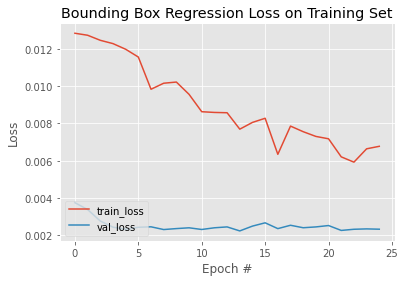

In [ ]:
print("[INFO] saving object detector model...")
model.save(MODEL_PATH, save_format='h5')
# plot the model training history
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, NUM_EPOCHS), history.history["loss"], label="train_loss")
plt.plot(np.arange(0, NUM_EPOCHS), history.history["val_loss"], label="val_loss")
plt.title("Bounding Box Regression Loss on Training Set")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend(loc="lower left")
plt.savefig(PLOT_PATH)

In [ ]:
# determine the input file type, but assume that we're working with
# single input image
filetype = mimetypes.guess_type('output/test_images.txt')[0]
# if the file type is a text file, then we need to process *multiple* images
if "text/plain" == filetype:
	# load the filenames in our testing file and initialize our list
	# of image paths
	test_images = open('output/test_images.txt').read().strip().split("\n")
	test_imagePaths = []
	# loop over the filenames
	for test_image in test_images:
		# construct the full path to the image filename and then
		# update our image paths list
		test_imagePaths.append(test_image)
test_imagePaths

['/content/gdrive/My Drive/Colab Notebooks/Rapsodo/dataset/assignment_sample_data/offline-Debug_2731_1582754668/IMG10.bmp',
 '/content/gdrive/My Drive/Colab Notebooks/Rapsodo/dataset/assignment_sample_data/offline-Debug_2615_1580668421/IMG23.bmp',
 '/content/gdrive/My Drive/Colab Notebooks/Rapsodo/dataset/assignment_sample_data/offline-Debug_2085_1580245859/IMG27.bmp',
 '/content/gdrive/My Drive/Colab Notebooks/Rapsodo/dataset/assignment_sample_data/offline-Debug_2443_1585078727/IMG19.bmp',
 '/content/gdrive/My Drive/Colab Notebooks/Rapsodo/dataset/assignment_sample_data/offline-Debug_2687_1583286734/IMG19.bmp',
 '/content/gdrive/My Drive/Colab Notebooks/Rapsodo/dataset/assignment_sample_data/offline-Debug_2114_1582645034/IMG14.bmp',
 '/content/gdrive/My Drive/Colab Notebooks/Rapsodo/dataset/assignment_sample_data/offline-Debug_2687_1583286734/IMG24.bmp',
 '/content/gdrive/My Drive/Colab Notebooks/Rapsodo/dataset/assignment_sample_data/offline-Debug_2669_1576023374/IMG20.bmp',
 '/conte

[INFO] loading object detector...


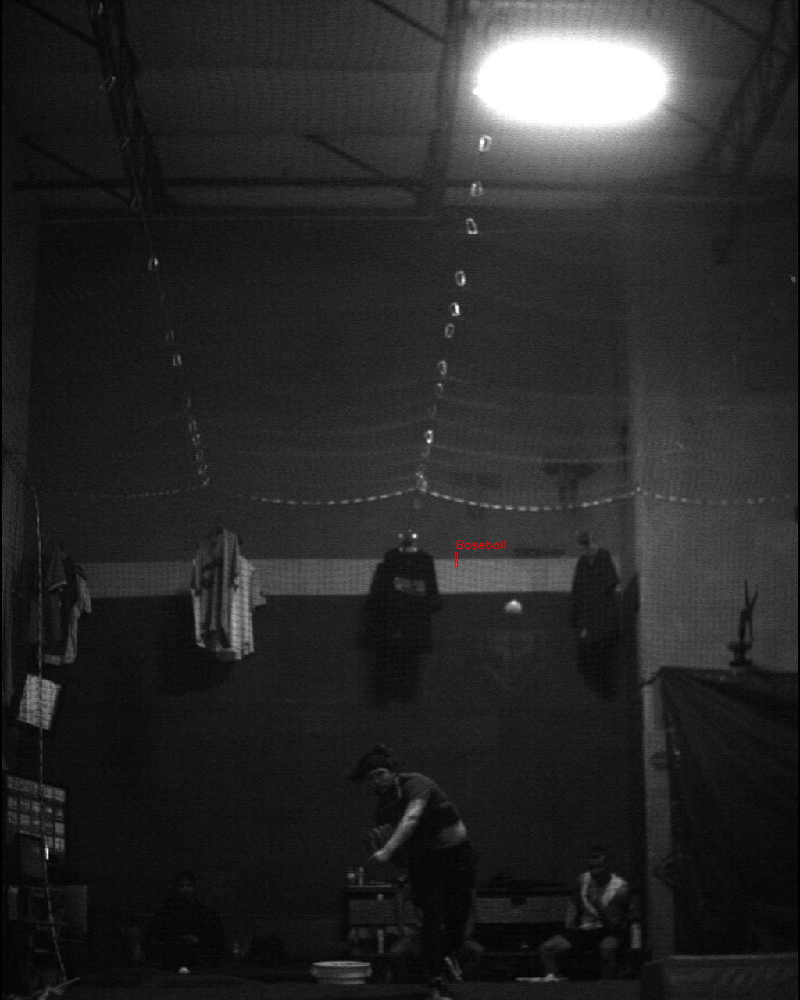

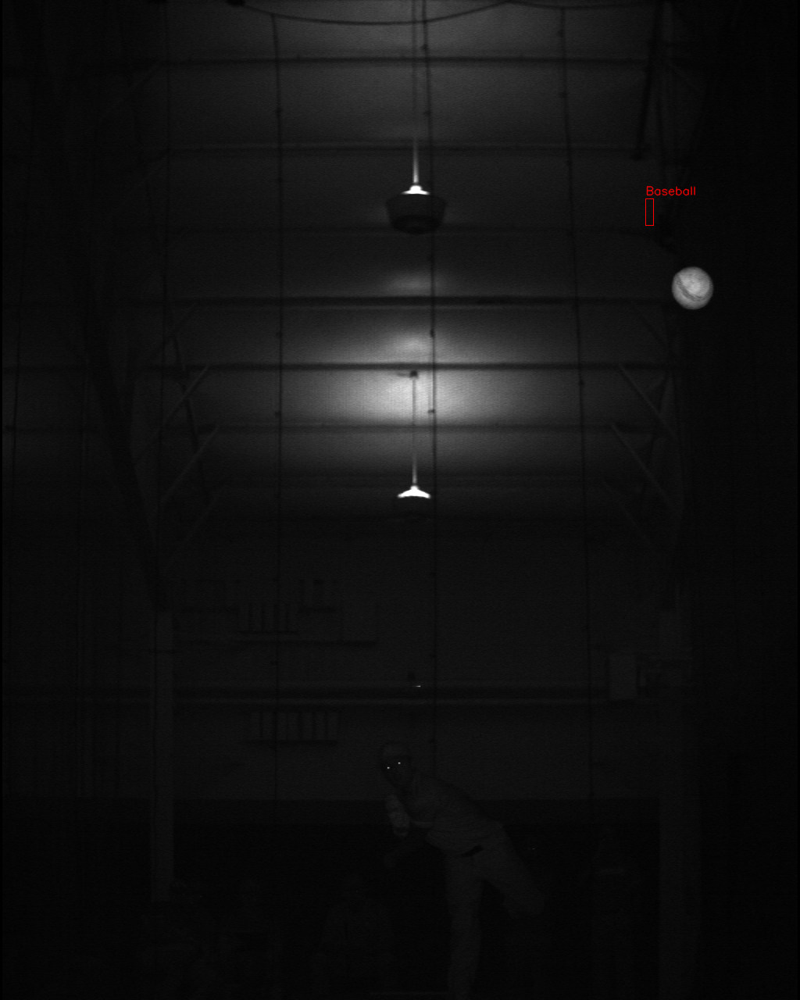

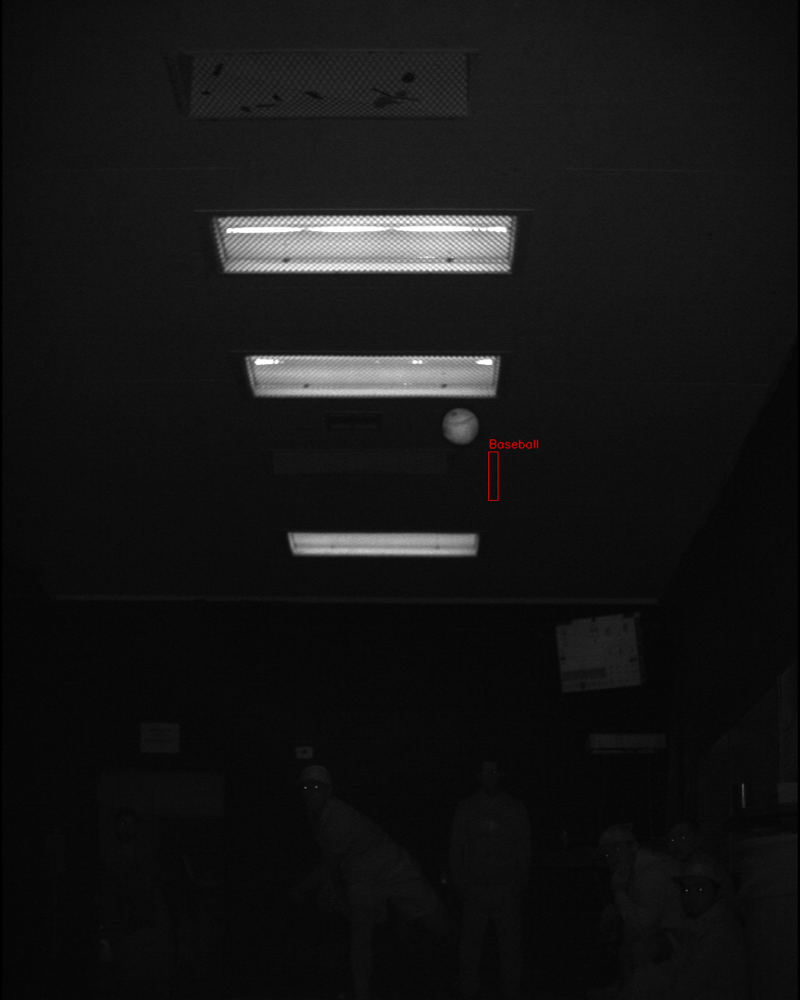

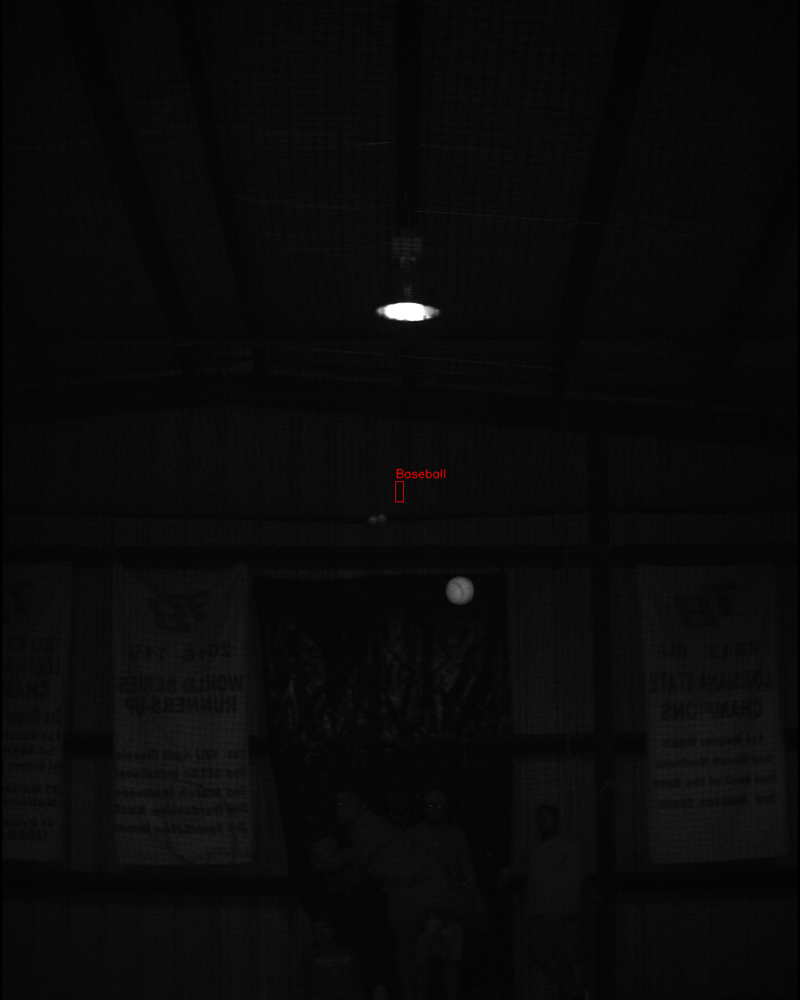

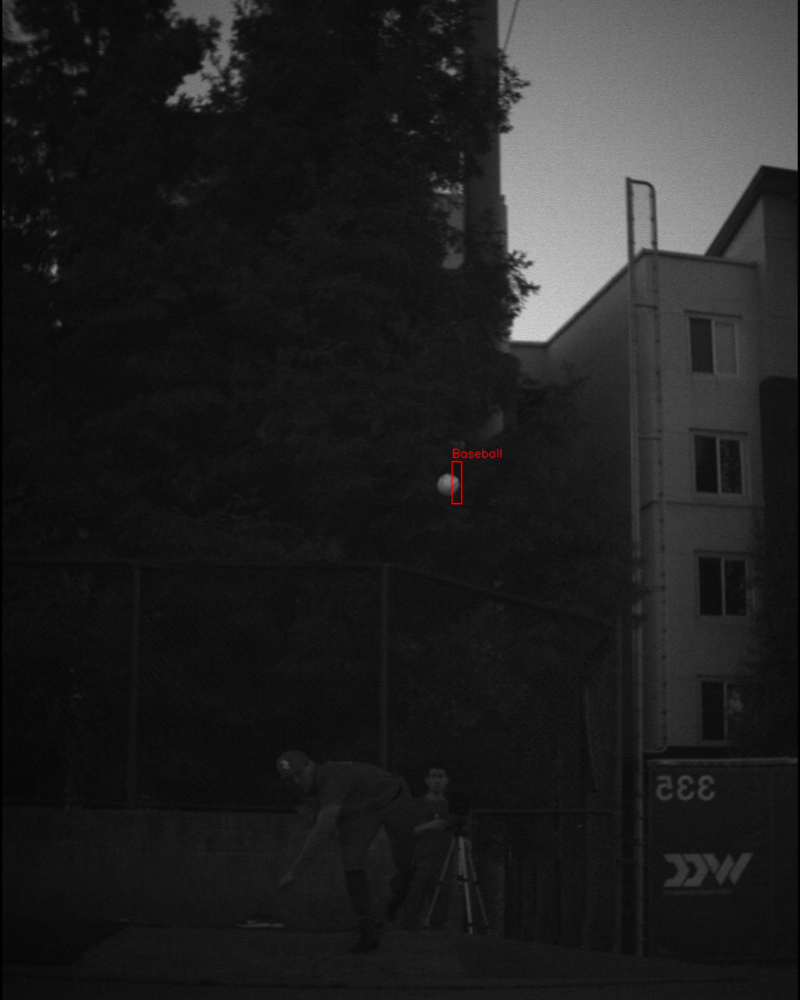

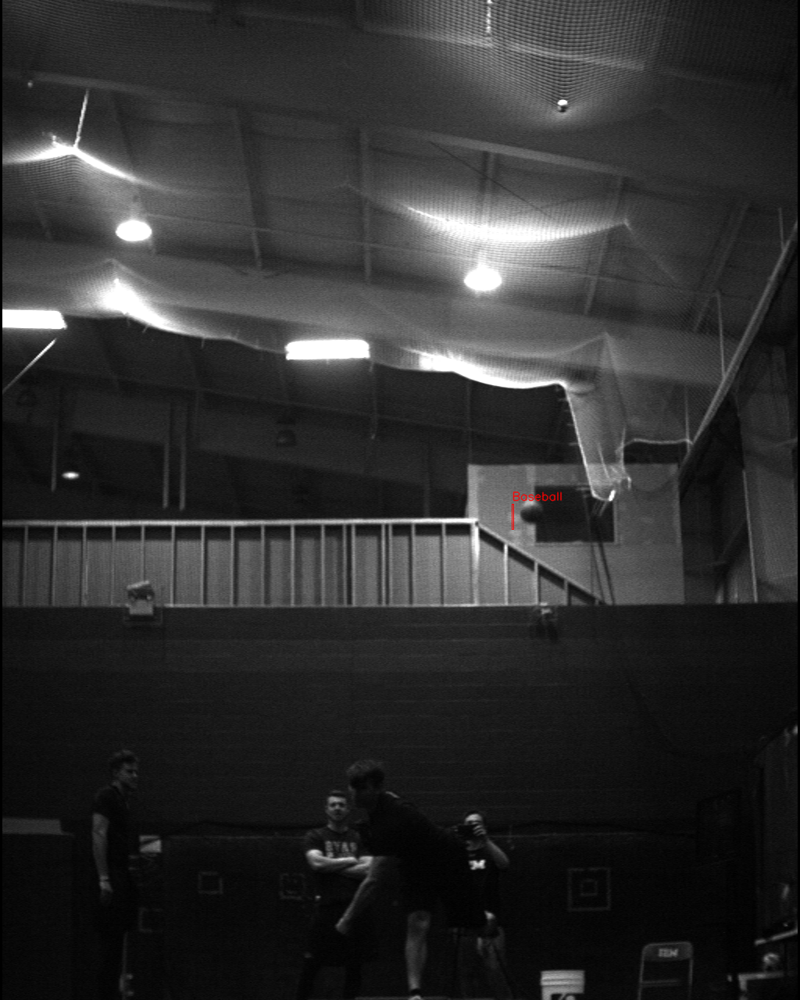

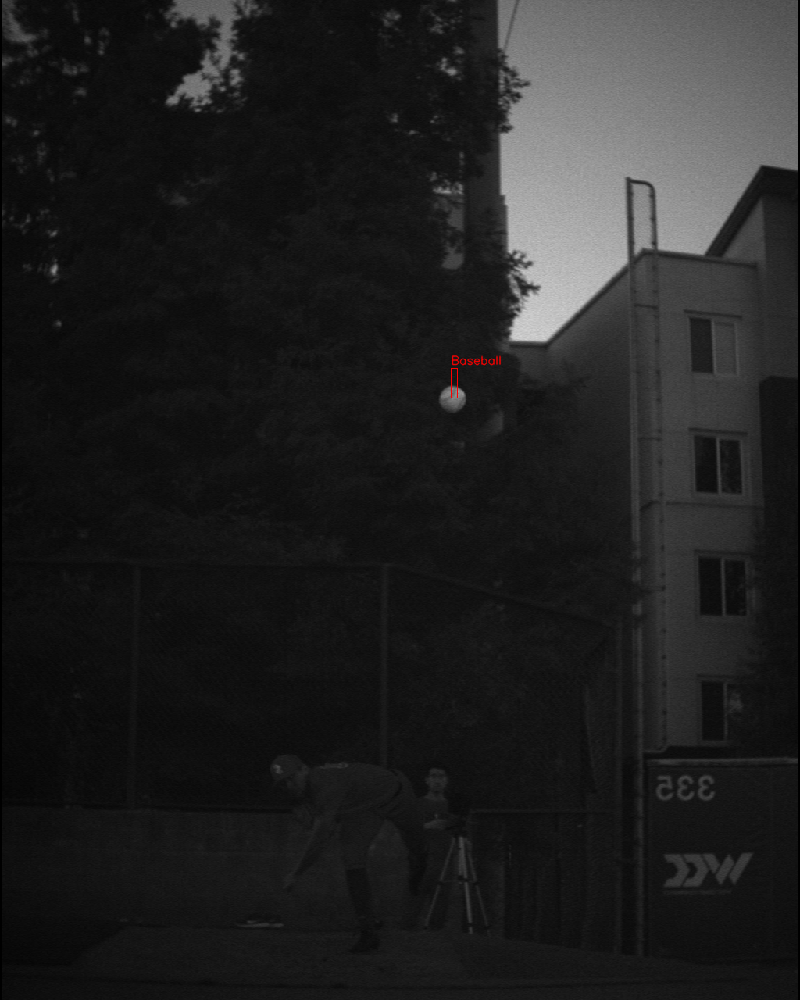

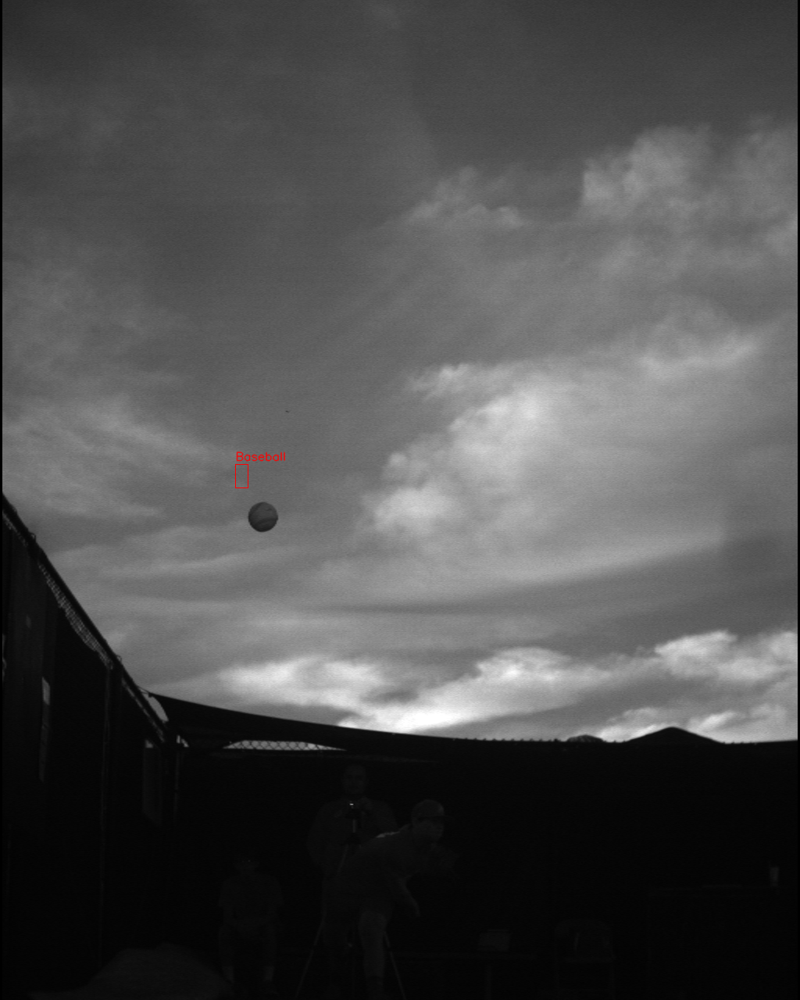

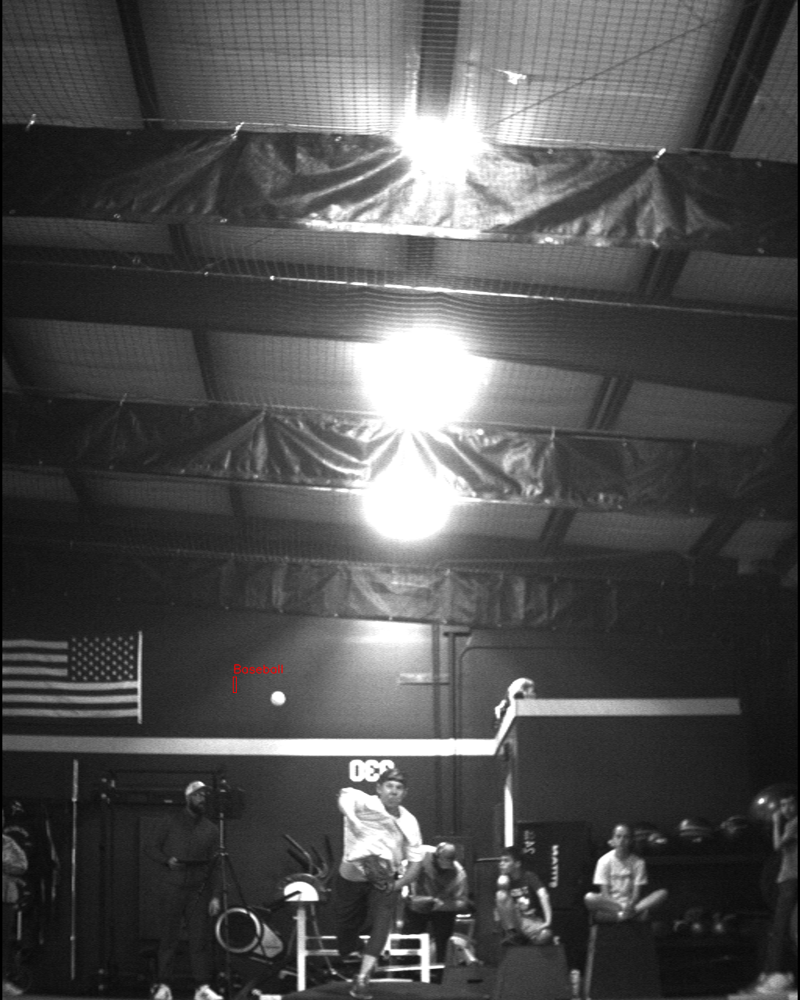

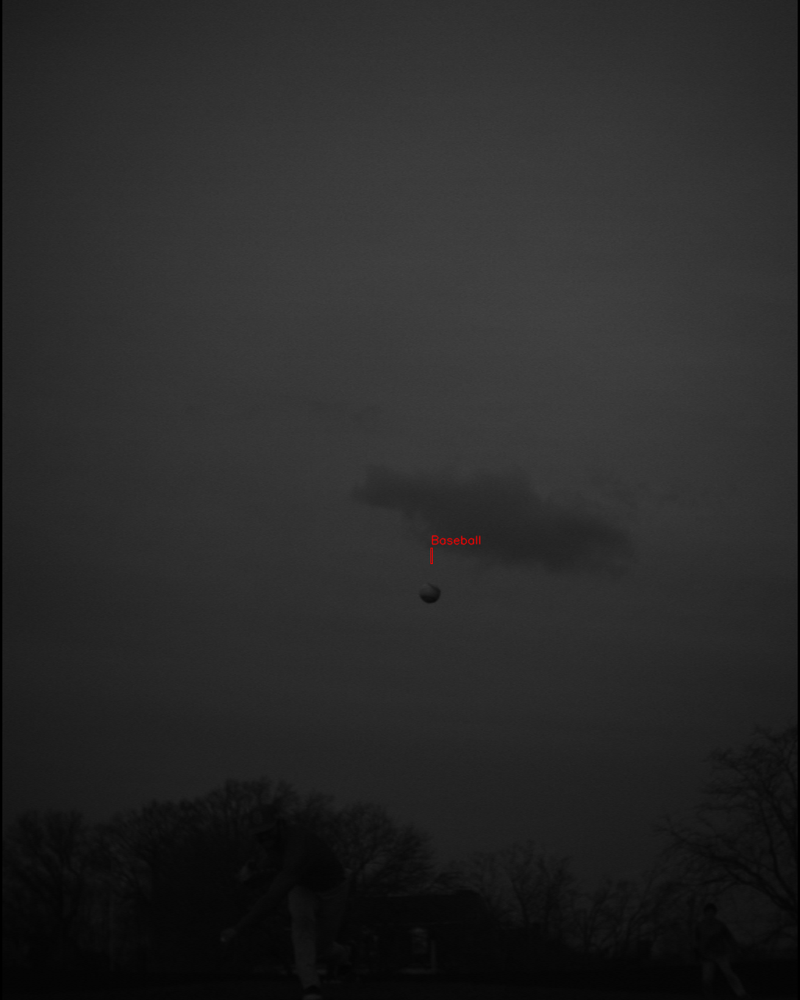

In [ ]:
# load our trained bounding box regressor from disk
print("[INFO] loading object detector...")
model = load_model(MODEL_PATH)
# loop over the images that we'll be testing using our bounding box
# regression model
for test_imagePath in test_imagePaths[:10]:
  # load the input image (in Keras format) from disk and preprocess
  # it, scaling the pixel intensities to the range [0, 1]
  image = load_img(test_imagePath, target_size=(224, 224))
  image = img_to_array(image) / 255.0
  image = np.expand_dims(image, axis=0)

  # make bounding box predictions on the input image
  preds = model.predict(image)[0]
  (startX, startY, w, h) = preds

  # load the input image (in OpenCV format), resize it such that it
  # fits on our screen, and grab its dimensions
  image = cv2.imread(test_imagePath)
  (image_h, image_w) = image.shape[:2]
  # scale the predicted bounding box coordinates based on the image
  # dimensions
  startX = int((startX) * image_w)
  startY = int((startY) * image_h)
  w = int((w) * image_w)
  h = int((h) * image_h)
  # draw the predicted bounding box on the image
  cv2.rectangle(image, (startX-int(w/2), startY-int(h/2)), (startX+int(w/2), startY+int(h/2)), 
                (0, 0, 255), 1)
  cv2.putText(image, 'Baseball', (startX-int(w/2), startY-int(h/2)-5), cv2.FONT_HERSHEY_SIMPLEX, 
              0.5, (0, 0, 255), 1, cv2.LINE_AA)
  # show the output image
  cv2_imshow(image)
  cv2.waitKey(0)

In [ ]:
"""
from tensorflow import keras

class DataLoader(keras.utils.Sequence):
  def __init__(self, data_info, batch_size=32):
    self.data_info = data_info
    self.batch_size = batch_size

  def __len__(self):
    return (np.ceil(len(self.data_info) / float(self.batch_size))).astype(np.int)

  def __getitem__(self, idx):
    batch_data_info = self.data_info[idx * self.batch_size : (idx+1) * self.batch_size]
    
    # loop over the rows
    for data_info in tqdm(batch_data_info):
      batch_data = []
      batch_targets = []
      batch_image_paths = []
      # break the row into the filename and bounding box coordinates
      data_info = data_info.split(",")
      (batch_image_path, startX, startY, endX, endY) = data_info

      # derive the path to the input image, load the image (in OpenCV
      # format), and grab its dimensions
      #image = cv2.imread(batch_image_path)
      #(h, w) = image.shape[:2]
      # scale the bounding box coordinates relative to the spatial
      # dimensions of the input image
      startX = float(startX) / 1024
      startY = float(startY) / 1280
      endX = float(endX) / 1024
      endY = float(endY) / 1280

      # load the image and preprocess it 
      image = load_img(batch_image_path, target_size=(224, 224))  #, color_mode='grayscale', 
      image = img_to_array(image)
      # update our list of data, targets, and filenames
      batch_data.append(image)
      batch_targets.append((startX, startY, endX, endY))
      batch_image_paths.append(batch_image_path)

      batch_data = np.array(batch_data, dtype="float32") / 255.0
      batch_targets = np.array(batch_targets, dtype="float32")

    return batch_data, batch_targets, batch_image_paths


# Load the contents of the CSV annotations file
print("[INFO] loading dataset...")
rows = open(ANNOTS_FILE).read().strip().split("\n")
# Initialize the list of data (images), our target output predictions (bounding box coordinates), along with the filenames of the individual images

train_rows, test_rows = train_test_split(rows[1:], test_size=0.10, random_state=42)

train_loader = DataLoader(train_rows, 32)
test_loader = DataLoader(test_rows, 32)

len(train_rows), len(test_rows)
"""